#https://medium.com/swlh/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc

Go through the link and make sure all files are ready before starting the google colab

Make sure to complete first three steps and then start with it

**STEP 4: MOUNT GOOGLE DRIVE**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#cd into the TensorFlow directory in your Google Drive
%cd '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow'


/content/drive/MyDrive/Objectdetection/Testing/Tensorflow


**STEP 5: DOWNLOAD TENSORFLOW MODEL GARDEN**


In [ ]:
#and clone the TensorFlow Model Garden repository
!git clone https://github.com/tensorflow/models.git

fatal: destination path 'models' already exists and is not an empty directory.


**STEP 6: INSTALL SOME LIBRARIES AND TOOLS**

In [ ]:
!apt-get install protobuf-compiler python-lxml python-pil
!pip install Cython pandas tf-slim

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 39 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 all 4.6.0-1 [67.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-pkg-resources all 39.0.1-2 [128 kB]
Get:3 http:/

**STEP 7-COMPLETE THE PROTOBUF LIBRARIES**

In [ ]:
#cd into 'TensorFlow/models/research'
%cd '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research'

!protoc object_detection/protos/*.proto --python_out=.

/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research


**STEP-8 SET THE ENVIRONMENT**

In [ ]:
import os
import sys
os.environ['PYTHONPATH']+=":/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models"
sys.path.append("/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research")

**STEP 9: BUILD AND INSTALL SETUP.PY**

If the setup.py is not avialable in the '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research' path, then copy it from models/research/object detection/packages/tf2/setup.py into the '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research' place.




In [ ]:

!python setup.py build
!python setup.py install

running build
running build_py
copying object_detection/protos/anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/argmax_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/bipartite_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/calibration_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/center_net_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/flexible_grid_anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_pb2.py -> 

**STEP 10: Build the installation**

In [ ]:
  #cd into 'TensorFlow/models/research/object_detection/builders/'
%cd '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research/object_detection/builders/'

!python model_builder_tf2_test.py
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
print('Done')

/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/models/research/object_detection/builders
2021-06-05 11:41:45.769552: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Running tests under Python 3.7.10: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-06-05 11:41:54.478001: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-05 11:41:54.548943: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-05 11:41:54.549540: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
202

**STEP 11: GENERATE TF RECORDS**

IF you are getting error in this step then its mostly due to images you have it in the train and test folders. If there are png images, you may get error and if there are some files corrupted then also you may get error

In [ ]:
#cd into preprocessing directory
%cd '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/scripts/preprocessing'
#run the cell to generate test.record and train.record
!python generate_tfrecord.py -x '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/images/train' -l '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/label_map.pbtxt' -o '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/train.record'
!python generate_tfrecord.py -x '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/images/test' -l '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/label_map.pbtxt' -o '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/test.record'
# !python generate_tfrecord.py -x '[path_to_train_folder]' -l '[path_to_annotations_folder]/label_map.pbtxt' -o '[path_to_annotations_folder]/train.record'
# !python generate_tfrecord.py -x '[path_to_test_folder]' -l '[path_to_annotations_folder]/label_map.pbtxt' -o '[path_to_annotations_folder]/test.record'

/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/scripts/preprocessing
Successfully created the TFRecord file: /content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/train.record
Successfully created the TFRecord file: /content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/test.record


**STEP 12: COPYING FILES**
Copy the “model_main_tf2.py” file from “TensorFlow\models\research\object_detection” and paste it in training_demo folder. We will need this file for training the model.
Copy the “exporter_main_v2.py” file from “TensorFlow\models\research\object_detection” and paste it in training_demo folder. We will need this file to export the trained model.

**STEP 13: CONFIGURE THE PIPLELINE FILE**

Make sure you make all changes specifically in the model name. 
10 changes have to made in the config file. Line numbers may vary!
If the "use_bfloat16" option is not there, then you can leave it.


**STEP 14: START TENSOR BOARD**

Initially, you will get a message saying “No dashboards are active for the current data set”. But once the training start, you will see various training metrics.


In [ ]:
#cd into training_demo
%cd '/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo'
#start the Tensorboard
%load_ext tensorboard
%tensorboard --logdir=models/my_ssd_mobilenet_v1_fpn
# %load_ext tensorboard
# %tensorboard --logdir=models/[name_of_pre-trained-model_you_downloaded]

/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!pip install lvis

In [ ]:
!python model_main_tf2.py --model_dir=models/my_ssd_mobilenet_v1_fpn --pipeline_config_path=models/my_ssd_mobilenet_v1_fpn/pipeline.config
# !python model_main_tf2.py --model_dir=models/[name_of_pre-trained-model_you_downloaded] --pipeline_config_path=models/[name_of_pre-trained-model_you_downloaded]/pipeline.config

2021-06-05 12:44:24.292114: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-05 12:44:26.564726: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-05 12:44:26.593136: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-05 12:44:26.593738: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-05 12:44:26.593785: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-05 12:44:26.596436: I tensorflow/stream_executor/platform/default

**STEP 16: EXPORT THE TRAINED MODEL**

In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path ./models/my_ssd_mobilenet_v1_fpn/pipeline.config --trained_checkpoint_dir ./models/my_ssd_mobilenet_v1_fpn/ --output_directory ./exported-models/my_model

2021-06-05 13:33:26.650081: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-05 13:33:28.633676: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-05 13:33:28.661912: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-05 13:33:28.662511: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-05 13:33:28.662554: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-05 13:33:28.666113: I tensorflow/stream_executor/platform/default

You should now have a new folder named **‘my_model’** inside your ‘training_demo/exported-models’ directory. This folder contains our saved_model.
Now it’s time to test our trained model!



**STEP 17- TESTING THE MODEL**



In [ ]:
#Loading the saved_model(change the path according to your directory names)
import tensorflow as tf
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL="/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/exported-models/my_model/saved_model"
print('Loading model...', end='')
# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')


Loading model...Done!


**STEP-18 TESTING THE MODEL (LOADING LABEL_MAP)**

In [ ]:
#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap('/content/drive/MyDrive/Objectdetection/Testing/Tensorflow/workspace/training_demo/annotations/label_map.pbtxt',use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

**STEP 19 - TESTING THE MODEL (LOADING IMAGES)**

Create a folder named test images in certain path and give it in the follwoing path. I have created on /content/drive/MyDrive/Objectdetection/Testing/Testimages

['/content/drive/MyDrive/Objectdetection/Testing/Testimages/fig4.png']


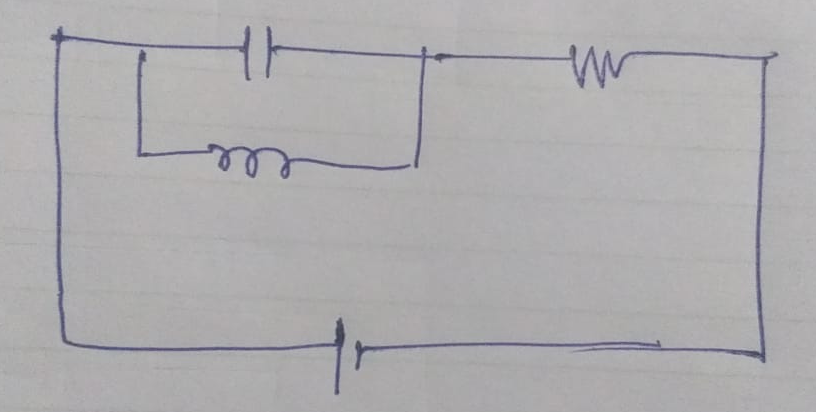

In [ ]:
#Loading the image

img=['/content/drive/MyDrive/Objectdetection/Testing/Testimages/fig4.png']
print(img)
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow

#Import image
image = cv2.imread("/content/drive/MyDrive/Objectdetection/Testing/Testimages/fig4.png")
plt.figure()
#Show the image with matplotlib
plt.imshow(image)
plt.show()
cv2_imshow(image)

**STEP 20: Running the interface**

Running inference for /content/drive/MyDrive/Objectdetection/Testing/Testimages/fig4.png... Done


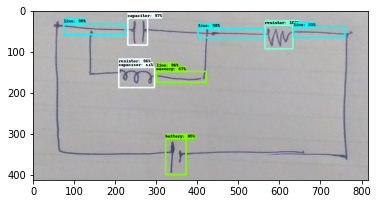

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
def load_image_into_numpy_array(path):
    return np.array(Image.open(path))
for image_path in img:
    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)
    input_tensor=tf.convert_to_tensor(image_np)
    input_tensor=input_tensor[tf.newaxis, ...]
    detections=detect_fn(input_tensor)
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy()
                   for key,value in detections.items()}
    detections['num_detections']=num_detections
    detections['detection_classes']=             detections['detection_classes'].astype(np.int64)
    image_np_with_detections=image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=100,     
          min_score_thresh=.5,      
          agnostic_mode=False)
%matplotlib inline
plt.figure()
plt.imshow(image_np_with_detections)
print('Done')
plt.show()
